In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing

#For Preprocessing
import re    # RegEx for removing non-letter characters
import nltk  #natural language processing
nltk.download("stopwords")
from nltk.corpus import stopwords
from nltk.stem.porter import *

# For Building the model
from sklearn.model_selection import train_test_split
import tensorflow as tf
import seaborn as sns

#For data visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline

pd.options.plotting.backend = "plotly"

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hugotk\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
df = pd.read_excel('base_de_dados_bitcoin.xlsx')

In [3]:
stop_words = set(stopwords.words('english'))

In [4]:
def preprocess_text(text):
    # Remover caracteres indesejados
    text = re.sub(r'@[A-Za-z0-9]+', '', text)  # remover menções de usuários
    text = re.sub(r'https?:\/\/\S+', '', text)  # remover URLs
    text = re.sub(r'[^\w\s]', '', text)  # remover pontuação
    text = re.sub(r'\d+', '', text)  # remover números
    # Normalizar texto
    text = text.lower()
    # Remover stop words
    text = ' '.join([word for word in text.split() if word not in stop_words])
    return text

In [5]:
df['Tweet'] = df['Tweet'].astype('str')
df['Tweet'] = df['Tweet'].apply(preprocess_text)
df

,Unnamed: 0,Date,User,Tweet
0,0,2023-04-04 12:43:04,CRYPT0411,donald trumps nft collection drops value follo...
1,1,2023-04-04 12:43:04,AkhmenHotepIV,defi decentralised finance next evolution fina...
2,2,2023-04-04 12:42:59,18se7enSoldier,inevitable abolishment cash introduction cbdcs...
3,3,2023-04-04 12:42:56,VinaBitcoin,zam super lowcap start new trend
4,4,2023-04-04 12:42:54,mmeemm4756,kaspa aka bitcoin little brother actually help...
...,...,...,...,...
499995,499995,2023-03-15 23:10:15,bitpodz,new coin stories global banking crisis explain...
499996,499996,2023-03-15 23:10:15,bitpodz,new citadel dispatch cd bank crisis bitcoin je...
499997,499997,2023-03-15 23:10:15,crypto_birb,thats clean breakout retest bitcoin heading bu...
499998,499998,2023-03-15 23:10:14,RevGenOne,good news digibyte bitcoin bad news ethereum s...


In [6]:
df.drop_duplicates(inplace=True)

In [7]:
df.dropna(axis=0, inplace=True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   Unnamed: 0  500000 non-null  int64         
 1   Date        500000 non-null  datetime64[ns]
 2   User        500000 non-null  object        
 3   Tweet       500000 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 15.3+ MB


In [9]:
selected_columns = df[['Date', 'User', 'Tweet']]
df = selected_columns.copy()

In [10]:
from nltk.sentiment import SentimentIntensityAnalyzer

#create a list with polarity of tweets
sia = SentimentIntensityAnalyzer()
polarities = []
for tweet in df.Tweet:
   polarity = sia.polarity_scores(tweet)['compound']
   polarities.append(polarity)
polarities

[0.802,
 0.0,
 0.3612,
 0.5994,
 0.7741,
 0.0,
 0.5293,
 -0.2263,
 0.3612,
 0.8225,
 0.2732,
 0.0,
 0.0,
 0.7741,
 0.8519,
 0.3182,
 -0.128,
 0.8225,
 0.5106,
 0.25,
 0.0,
 -0.128,
 0.0,
 0.7717,
 0.7096,
 0.3477,
 0.4939,
 -0.3182,
 -0.5574,
 0.4404,
 -0.25,
 -0.296,
 0.5106,
 0.0,
 0.6369,
 0.0,
 0.3818,
 0.7096,
 -0.296,
 0.5574,
 -0.1531,
 0.3182,
 0.4404,
 0.0,
 0.0,
 0.0,
 0.3182,
 0.5106,
 0.0,
 0.5106,
 0.0,
 0.5719,
 0.0,
 -0.3818,
 0.2732,
 0.0,
 -0.296,
 -0.5719,
 -0.0475,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0772,
 0.5106,
 0.0,
 -0.4442,
 -0.4019,
 0.3612,
 0.0,
 0.7506,
 0.4404,
 0.34,
 0.0,
 0.5106,
 0.0,
 -0.5664,
 0.0,
 0.0,
 0.7351,
 0.0,
 0.0,
 0.4404,
 0.8176,
 0.7506,
 0.0,
 0.0,
 0.0,
 0.5106,
 0.0,
 -0.1335,
 0.34,
 0.0,
 0.34,
 0.0,
 0.3477,
 0.0,
 0.4939,
 0.0,
 -0.7964,
 -0.2263,
 -0.4019,
 0.4767,
 0.8176,
 0.25,
 0.5719,
 -0.3612,
 0.0,
 -0.6486,
 -0.4767,
 0.0,
 0.1531,
 0.0,
 0.6369,
 0.0,
 0.9001,
 -0.7906,
 0.0258,
 0.6369,
 0.0,
 0.1531,
 0.0,
 0.785,

In [11]:
#Create a column polarity in dataframe
df['Polarity'] = polarities

In [12]:
#Transform polarity in a sentiment
def classify_sentiment(polarity):
    if polarity > 0:
        return 'positive'
    elif polarity < 0:
        return 'negative'
    else:
        return 'neutral'

In [13]:
#Create a columns with sentiment os tweets
df['Sentiment'] = df['Polarity'].apply(classify_sentiment)
df

,Date,User,Tweet,Polarity,Sentiment
0,2023-04-04 12:43:04,CRYPT0411,donald trumps nft collection drops value follo...,0.8020,positive
1,2023-04-04 12:43:04,AkhmenHotepIV,defi decentralised finance next evolution fina...,0.0000,neutral
2,2023-04-04 12:42:59,18se7enSoldier,inevitable abolishment cash introduction cbdcs...,0.3612,positive
3,2023-04-04 12:42:56,VinaBitcoin,zam super lowcap start new trend,0.5994,positive
4,2023-04-04 12:42:54,mmeemm4756,kaspa aka bitcoin little brother actually help...,0.7741,positive
...,...,...,...,...,...
499995,2023-03-15 23:10:15,bitpodz,new coin stories global banking crisis explain...,-0.6249,negative
499996,2023-03-15 23:10:15,bitpodz,new citadel dispatch cd bank crisis bitcoin je...,-0.6249,negative
499997,2023-03-15 23:10:15,crypto_birb,thats clean breakout retest bitcoin heading bu...,0.7639,positive
499998,2023-03-15 23:10:14,RevGenOne,good news digibyte bitcoin bad news ethereum s...,-0.1531,negative


<Axes: xlabel='Sentiment', ylabel='count'>

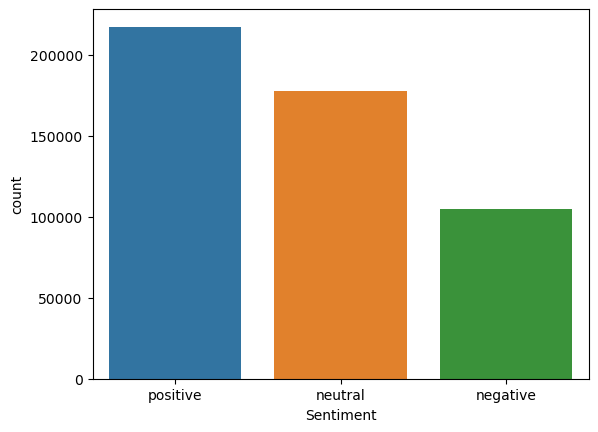

In [14]:
# The distribution of sentiments
sns.countplot(x=df['Sentiment'])

In [15]:
#Calculate tweet legths
tweet_len = pd.Series([len(tweet.split()) for tweet in df['Tweet']])
#Distribution of tweet text lengths
tweet_len.plot(kind='box')

In [16]:
df

,Date,User,Tweet,Polarity,Sentiment
0,2023-04-04 12:43:04,CRYPT0411,donald trumps nft collection drops value follo...,0.8020,positive
1,2023-04-04 12:43:04,AkhmenHotepIV,defi decentralised finance next evolution fina...,0.0000,neutral
2,2023-04-04 12:42:59,18se7enSoldier,inevitable abolishment cash introduction cbdcs...,0.3612,positive
3,2023-04-04 12:42:56,VinaBitcoin,zam super lowcap start new trend,0.5994,positive
4,2023-04-04 12:42:54,mmeemm4756,kaspa aka bitcoin little brother actually help...,0.7741,positive
...,...,...,...,...,...
499995,2023-03-15 23:10:15,bitpodz,new coin stories global banking crisis explain...,-0.6249,negative
499996,2023-03-15 23:10:15,bitpodz,new citadel dispatch cd bank crisis bitcoin je...,-0.6249,negative
499997,2023-03-15 23:10:15,crypto_birb,thats clean breakout retest bitcoin heading bu...,0.7639,positive
499998,2023-03-15 23:10:14,RevGenOne,good news digibyte bitcoin bad news ethereum s...,-0.1531,negative


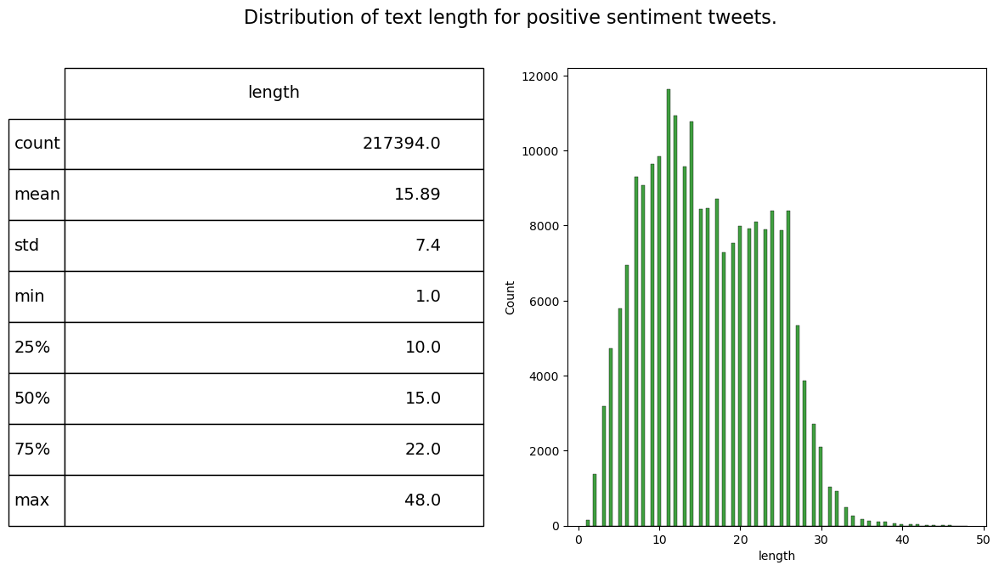

In [17]:
fig = plt.figure(figsize=(14,7))
df['length'] = df.Tweet.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(df[df['Sentiment']=='positive']['length'], ax=ax1, color='green')
describe = df.length[df.Sentiment == 'positive'].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 14
bbox = [0, 0, 1, 1]
table = ax2.table(cellText= describe.values, rowLabels= describe.index, bbox= bbox, colLabels= describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for positive sentiment tweets.', fontsize=16)

plt.show()

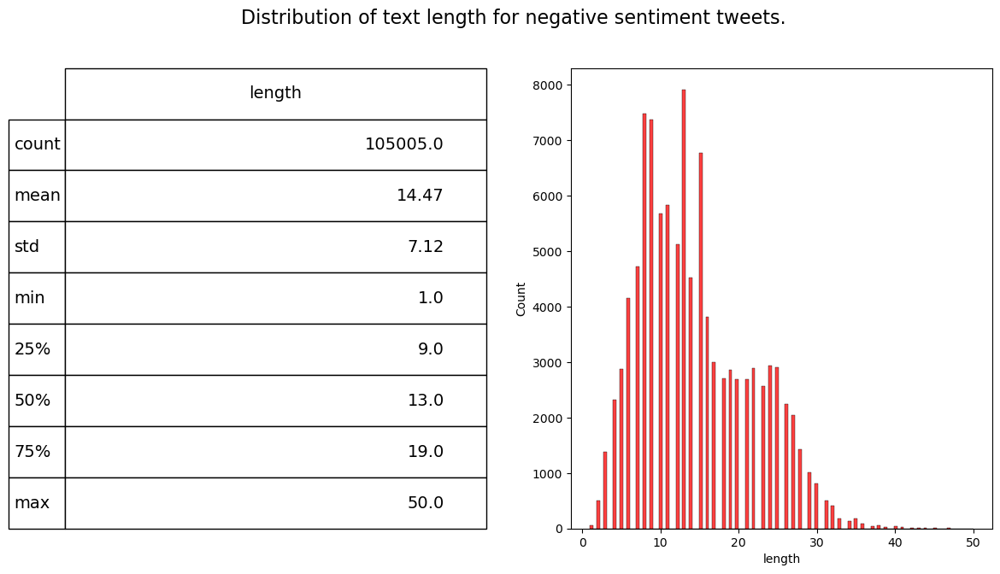

In [18]:
fig = plt.figure(figsize=(14,7))
df['length'] = df.Tweet.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(df[df['Sentiment']=='negative']['length'], ax=ax1, color='red')
describe = df.length[df.Sentiment == 'negative'].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 14
bbox = [0, 0, 1, 1]
table = ax2.table(cellText= describe.values, rowLabels= describe.index, bbox= bbox, colLabels= describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for negative sentiment tweets.', fontsize=16)

plt.show()

In [19]:
df.drop(['length'], axis=1, inplace=True)
df

,Date,User,Tweet,Polarity,Sentiment
0,2023-04-04 12:43:04,CRYPT0411,donald trumps nft collection drops value follo...,0.8020,positive
1,2023-04-04 12:43:04,AkhmenHotepIV,defi decentralised finance next evolution fina...,0.0000,neutral
2,2023-04-04 12:42:59,18se7enSoldier,inevitable abolishment cash introduction cbdcs...,0.3612,positive
3,2023-04-04 12:42:56,VinaBitcoin,zam super lowcap start new trend,0.5994,positive
4,2023-04-04 12:42:54,mmeemm4756,kaspa aka bitcoin little brother actually help...,0.7741,positive
...,...,...,...,...,...
499995,2023-03-15 23:10:15,bitpodz,new coin stories global banking crisis explain...,-0.6249,negative
499996,2023-03-15 23:10:15,bitpodz,new citadel dispatch cd bank crisis bitcoin je...,-0.6249,negative
499997,2023-03-15 23:10:15,crypto_birb,thats clean breakout retest bitcoin heading bu...,0.7639,positive
499998,2023-03-15 23:10:14,RevGenOne,good news digibyte bitcoin bad news ethereum s...,-0.1531,negative


In [20]:
from wordcloud import WordCloud, STOPWORDS

In [60]:
def wordcount_gen1(df):
    #Generating word cloud - inputs: df = tweets database and sentiment = positive/neutral/negative
    
    #Combine all tweets
    combined_tweets = ' '.join([tweet for tweet in df['Tweet']])
    
    #Initialize wordcloud object
    wc = WordCloud(background_color='white', max_words=50, stopwords=STOPWORDS)
    
    #Generate and plot wordcloud
    plt.figure(figsize=(10,10))
    plt.imshow(wc.generate(combined_tweets))
    plt.title('Sentiment Words', fontsize=20)
    plt.axis('off')
    plt.show()
    

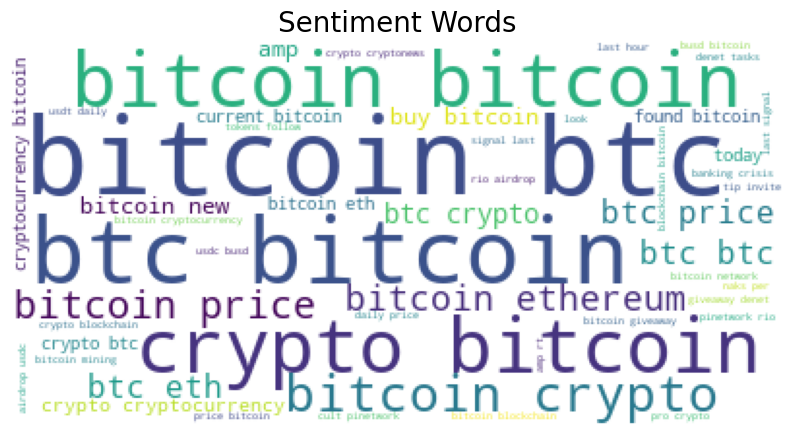

In [61]:
wordcount_gen1(df)

In [53]:
def wordcount_gen(df, sentiment):
    #Generating word cloud - inputs: df = tweets database and sentiment = positive/neutral/negative
    
    #Combine all tweets
    combined_tweets = ' '.join([tweet for tweet in df[df.Sentiment==sentiment]['Tweet']])
    
    #Initialize wordcloud object
    wc = WordCloud(background_color='white', max_words=50, stopwords=STOPWORDS)
    
    #Generate and plot wordcloud
    plt.figure(figsize=(10,10))
    plt.imshow(wc.generate(combined_tweets))
    plt.title('{} Sentiment Words'.format(sentiment), fontsize=20)
    plt.axis('off')
    plt.show()
    

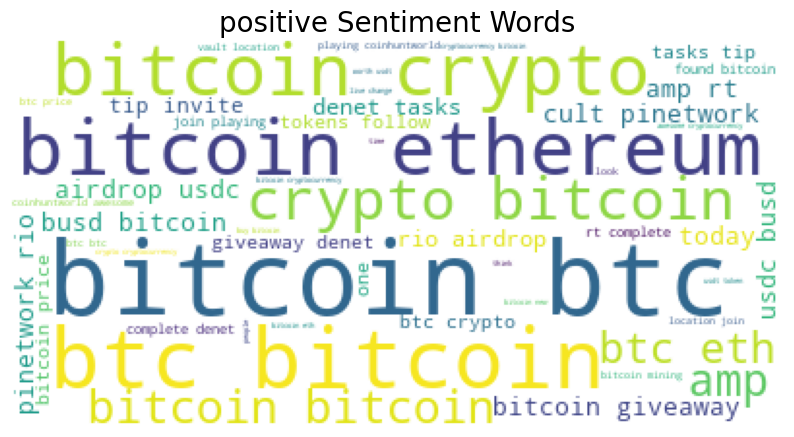

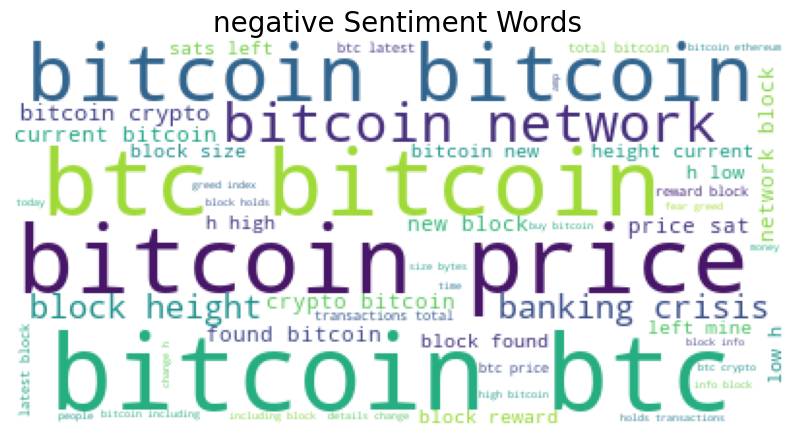

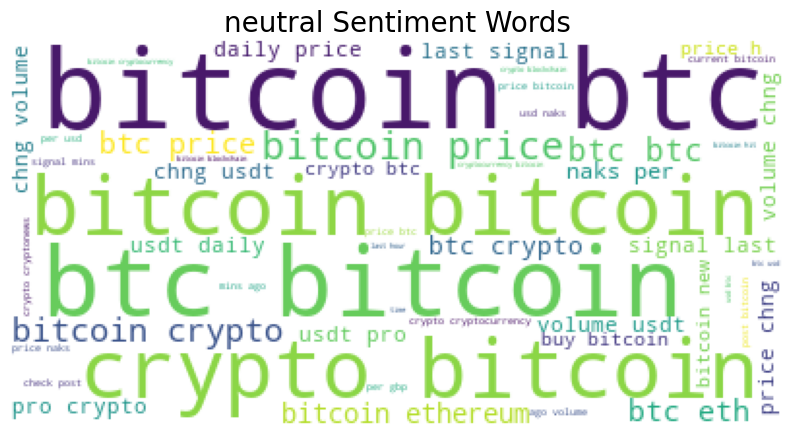

In [22]:
wordcount_gen(df, 'positive')
wordcount_gen(df, 'negative')
wordcount_gen(df, 'neutral')


In [23]:
df['Tweet'][0]

'donald trumps nft collection drops value following indictment news came former united states president donald trump officially indicted manhattan grand jury continued post donald trumps bitcoin crypto nft'

In [24]:
from nltk.stem import WordNetLemmatizer

#Lemmatization
lemm = WordNetLemmatizer()

def lemmating(data):
    text = data.split()
    text = [lemm.lemmatize(t) for t in text]
    return text

In [25]:
lemmating(df['Tweet'][0])

['donald',
 'trump',
 'nft',
 'collection',
 'drop',
 'value',
 'following',
 'indictment',
 'news',
 'came',
 'former',
 'united',
 'state',
 'president',
 'donald',
 'trump',
 'officially',
 'indicted',
 'manhattan',
 'grand',
 'jury',
 'continued',
 'post',
 'donald',
 'trump',
 'bitcoin',
 'crypto',
 'nft']

In [26]:
X = list(map(lemmating, df['Tweet']))

In [27]:
from sklearn.preprocessing import LabelEncoder

#Encode target labels
le = LabelEncoder()
Y = le.fit_transform(df['Sentiment'])

In [28]:
print(X[0])
print(Y[0])

['donald', 'trump', 'nft', 'collection', 'drop', 'value', 'following', 'indictment', 'news', 'came', 'former', 'united', 'state', 'president', 'donald', 'trump', 'officially', 'indicted', 'manhattan', 'grand', 'jury', 'continued', 'post', 'donald', 'trump', 'bitcoin', 'crypto', 'nft']
2


In [29]:
#Train and Test split

y = pd.get_dummies(df['Sentiment'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

In [31]:
#Bag of Words BOW feature extraction

from sklearn.feature_extraction.text import CountVectorizer

vocabulary_size = 8000

#Tweets have already been preprocessed hence dummy function will be passed in to preprocessor and tokenizer step
#Parameter ngram_range = (1,2) - unigram and bigram
count_vector = CountVectorizer(max_features=vocabulary_size,
                               preprocessor= lambda x: x, 
                               tokenizer= lambda x: x)  

#Fit the training 
X_train = count_vector.fit_transform(X_train).toarray()

#Transform testing
X_test=count_vector.transform(X_test).toarray()

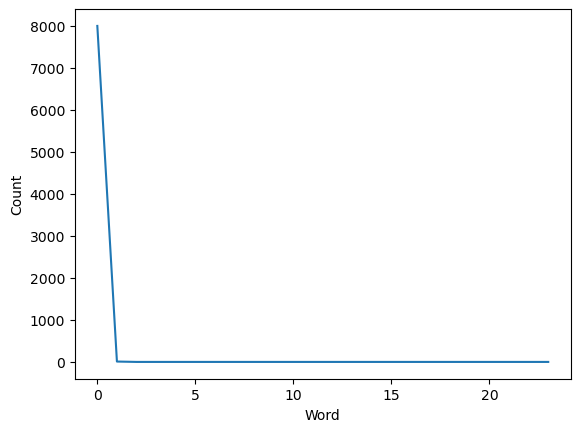

In [32]:
# Plot the BoW feature vector
plt.plot(X_train[2,:])
plt.xlabel('Word')
plt.ylabel('Count')
plt.show()

In [33]:
from keras.preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences

max_word = 5000
max_len = 50

def tokenize_pad_sequences(text):
    #This function tokenize the input text into sequences od intergers and then pad each sequence to tha same length
    #Text tokenization
    tokenizer = Tokenizer(num_words=max_word, lower=True, split=' ')
    tokenizer.fit_on_texts(text)
    
    #Transforms text to a sequence of integer
    X = tokenizer.texts_to_sequences(text)
    #Pad sequences to the same length
    X = pad_sequences(X, padding='post', maxlen=max_len)
    #Return sequences
    return X, tokenizer

print('Before Tokenization and Padding \n', df['Tweet'][0])
X, tokenizer = tokenize_pad_sequences(df['Tweet'])
print('After Tokenization and Passing \n', X[0])

Before Tokenization and Padding 
 donald trumps nft collection drops value following indictment news came former united states president donald trump officially indicted manhattan grand jury continued post donald trumps bitcoin crypto nft
After Tokenization and Passing 
 [  13  514  794   63  396 3704   18 1252  632 1070  898 1058 1183 1393
 3963 1964  190    1    3   13    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0]


In [34]:
import pickle 

#Saving
with open('tokenizer.pickle', 'wb') as handle:
    pickle.dump(tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)

#Loading
with open('tokenizer.pickle', 'rb') as handle:
    tokenizer = pickle.load(handle)

In [35]:
#Train and Test split

y = pd.get_dummies(df['Sentiment'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=1)
print('Train Set ->', X_train.shape, y_train.shape)
print('Validation Set ->', X_val.shape, y_val.shape)
print('Test Set ->', X_test.shape, y_test.shape)

Train Set -> (320000, 50) (320000, 3)
Validation Set -> (80000, 50) (80000, 3)
Test Set -> (100000, 50) (100000, 3)


In [36]:
import keras.backend as K

def f1_score(precision, recall):
    #Funcion to calculate f1 score
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [37]:
#Bidirectional LSTM using NN
from keras.models import Sequential
from keras.layers import Embedding, Conv1D, MaxPooling1D, Bidirectional, LSTM, Dense, Dropout
from keras.metrics import Precision, Recall
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras import datasets

from keras.callbacks import LearningRateScheduler
from keras.callbacks import History

from keras import losses

In [38]:
vocab_size = 8000
embedding_size = 32
epochs = 20
learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

In [39]:
sgd = SGD(learning_rate=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)

model = Sequential()
model.add(Embedding(vocab_size, embedding_size, input_length=max_len))
model.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(Bidirectional(LSTM(32)))
model.add(Dropout(0.4))
model.add(Dense(3, activation='softmax'))

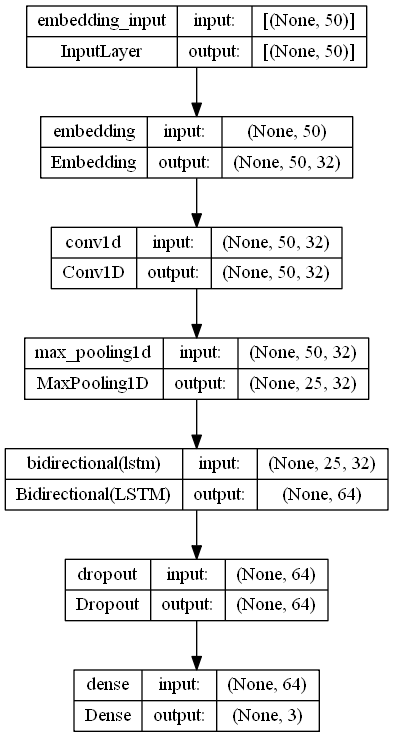

In [40]:
import tensorflow as tf
tf.keras.utils.plot_model(model, show_shapes=True)

In [41]:
print(model.summary())

#Compile model
model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy', Precision(), Recall()])

#Train model
batch_size = 128
history = model.fit(X_train, y_train, validation_data = (X_val, y_val), batch_size=batch_size, epochs=epochs, verbose=1)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 50, 32)            256000    
                                                                 
 conv1d (Conv1D)             (None, 50, 32)            3104      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 25, 32)           0         
 )                                                               
                                                                 
 bidirectional (Bidirectiona  (None, 64)               16640     
 l)                                                              
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense (Dense)               (None, 3)                 1

In [42]:
#Evaluate model on the teste set
loss, accuracy, precision, recall = model.evaluate(X_test, y_test, verbose=0)

#print metrics
print('')
print('Accuracy : {:.4f}'.format(accuracy))
print('Precision : {:.4f}'.format(precision))
print('Recall : {:.4f}'.format(recall))
print('F1 Score  : {:.4f}'.format(f1_score(precision, recall)))



Accuracy : 0.9252
Precision : 0.9281
Recall : 0.9221
F1 Score  : 0.9251


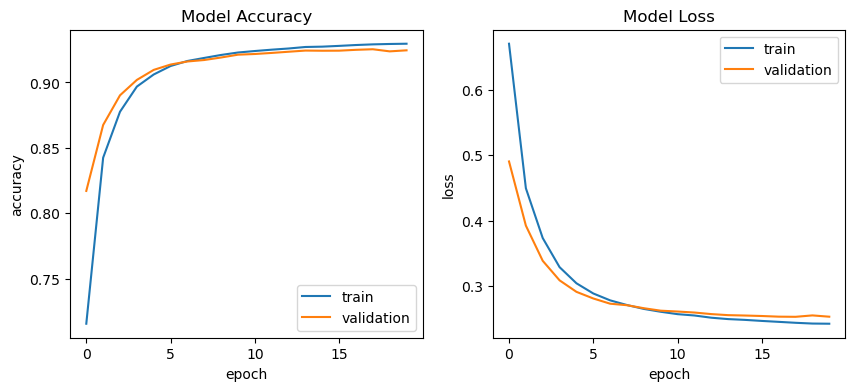

In [43]:
def plot_training_hist(history):
    #Function to plot history for accuracy and loss
    
    fig, ax = plt.subplots(1, 2, figsize=(10,4))
    
    #First plot
    ax[0].plot(history.history['accuracy'])
    ax[0].plot(history.history['val_accuracy'])
    ax[0].set_title('Model Accuracy')
    ax[0].set_xlabel('epoch')
    ax[0].set_ylabel('accuracy')
    ax[0].legend(['train', 'validation'], loc='best')
    #Second plot
    ax[1].plot(history.history['loss'])
    ax[1].plot(history.history['val_loss'])
    ax[1].set_title('Model Loss')
    ax[1].set_xlabel('epoch')
    ax[1].set_ylabel('loss')
    ax[1].legend(['train', 'validation'], loc='best')
    
plot_training_hist(history)    

3125/3125 [==============================] - 40s 12ms/step


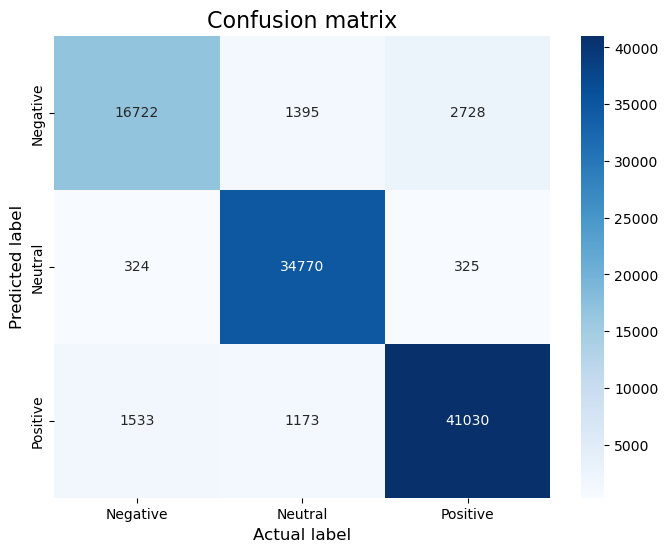

In [44]:
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(model, X_test, y_test):
    #Function to plot confusion matrix for the passed model and the data
    
    sentiment_classes = ['Negative', 'Neutral', 'Positive']
    #Use model to do the prediction
    y_pred = model.predict(X_test)
    #Compute confusion matrix
    cm = confusion_matrix(np.argmax(np.array(y_test),axis=1), np.argmax(y_pred, axis=1))
    #Plot confusion matrix
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, cmap=plt.cm.Blues, annot=True, fmt='d', 
                xticklabels=sentiment_classes,
                yticklabels=sentiment_classes)
    plt.title('Confusion matrix', fontsize=16)
    plt.xlabel('Actual label', fontsize=12)
    plt.ylabel('Predicted label', fontsize=12)
    
plot_confusion_matrix(model, X_test, y_test)

In [45]:
#Save the model architecture & the weights
model.save('best_model.h5')
print('Best model saved')

Best model saved


In [46]:
from keras.models import load_model

#Load model
model = load_model('best_model.h5')

def predict_class(text):
    #Function to predict sentiment class of the passed text
    
    sentiment_classes = ['Negative', 'Neutral', 'Positive']
    max_len=50
    
    #Transforms text to a sequence of integers using a tokenizer object
    xt = tokenizer.texts_to_sequences(text)
    #Pad sequences to the same length
    xt = pad_sequences(xt, padding='post', maxlen=max_len)
    #Do the prediction using the loaded model
    yt = model.predict(xt).argmax(axis=1)
    #Print the predicted sentiment
    print('The predicted sentiment is', sentiment_classes[yt[0]])

In [50]:
predict_class(['Bitcoin is better than money'])

1/1 [==============================] - 1s 500ms/step
The predicted sentiment is Positive
